In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import random
import torch
import numpy as np
import pickle
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import zipfile
import os
import matplotlib.pyplot as plt
import torchvision
from torchvision import transforms


skipAugmentation = True

torch.manual_seed(40)
torch.cuda.manual_seed(40)
np.random.seed(40)
random.seed(40)

data_root = "./dataset/plates"
train_folder = data_root+"/train"

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
torch.cuda.is_available()

True

In [ ]:
!rm -r ./dataset ./train ./val

In [ ]:
!unzip -q /content/drive/MyDrive/Plates/plates.zip -d dataset

In [ ]:
!ls ./dataset

__MACOSX  plates


In [ ]:
!rm -r ./dataset/__MACOSX  ./dataset/plates/train/{cleaned,dirty}/.DS_Store ./dataset/plates/test/.DS_Store

In [ ]:
!ls ./dataset/plates/

test  train


In [ ]:
import shutil 
from tqdm import tqdm

train_dir = 'train'
val_dir = 'val'

class_names = ['cleaned', 'dirty']

for dir_name in [train_dir, val_dir]:
    for class_name in class_names:
        os.makedirs(os.path.join(dir_name, class_name), exist_ok=True)

for class_name in class_names:
    # Удаляем файл, не нужный для обучения
    source_dir = os.path.join(train_folder, class_name)
    for i, file_name in enumerate(tqdm(os.listdir(source_dir))):
        if i % 4 != 0:
            dest_dir = os.path.join(train_dir, class_name)
        else:
            dest_dir = os.path.join(val_dir, class_name)
            
        shutil.copy(os.path.join(source_dir, file_name), os.path.join(dest_dir, file_name))

100%|██████████| 20/20 [00:00<00:00, 3148.88it/s]


По итогу: имеем две папки: папка с чистыми тарелками и папка с грязными тарелками.

---

### Задача: создать массив всевозможных комбинаций аугментаций
В дальнейшем, измерим качество на каждой из комбинаций аугментаций и найдём лучшую комбинацию

Импортируем необходимые библиотеки:

### Сначала определим перебираемые аугментации

0. Создадим тождественную аугментацию.

In [ ]:
class IdentityTransform():
    def __init__(self):
        None
    def __call__(self, png):
        return png

1. Создадим массив аугментаций, изменяющих цвет картинки:

In [ ]:
import torchvision.transforms as T
jitters = [("Indentity_jitter", IdentityTransform()),
           ("Brighten+Hue", T.ColorJitter(brightness = 0.4, hue = 0.5, saturation = 0.)), 
           ("Brighten+Saturate", T.ColorJitter(brightness = 0.4, hue = 0., saturation = 0.4)),
           ("Hue+Saturate", T.ColorJitter(brightness = 0., hue = 0.5, saturation = 0.4)), 
           ("Chaos", T.ColorJitter(brightness = 0.4, hue = 0.5, saturation = 0.4))]

torch.Size([3, 256, 341])


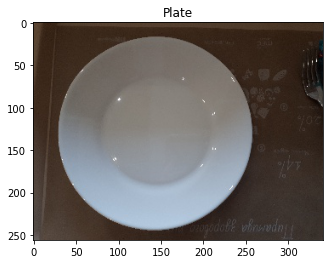

In [ ]:
from PIL import Image

path = train_folder + "/cleaned/0001.jpg"
img = Image.open(path)
img = transforms.ToTensor()(img)
print(img.shape)
plt.title("Plate")
plt.imshow(img.permute(1, 2, 0))
plt.show()

2. Создадим класс, поворачивающий картинку на произвольный угол, обрезающий её и приводящий к исходному размеру:

In [ ]:
from math import sin, cos, ceil, pi

class RandomRotateAndResize:
    def __init__(self, angle, flip, cutBlack = True):
        # Переворачиваем ли картинку?
        self.flip = flip
        self.cutBlack = cutBlack
        if angle < 0 or angle >= 45:
            raise ValueError("Angle must be in range [0; 45)")
        # Выбираем поворот на 0, 90, 180, 270 градусов + маленькая дельта, чтобы фичи разные были
        self.angles = [[-angle, angle], [90-angle, 90+angle], [180-angle, 180+angle], [270-angle, 270+angle]]
        
    def __call__(self, pic):
        # Если мы в нашем классе разрешили зеркальные отражения, то равновероятно применим либо горизонтальное, либо вертикальное
        # отражение
        if self.flip:
            mode = int(torch.rand(1).item()*3)
            if mode == 1:
                pic = T.functional.hflip(pic)
            if mode == 2:
                pic = T.functional.vflip(pic)
        # Сгенерируем случайный угол поворота изображения:
        rotation_range = self.angles[int(torch.rand(1)*3)]
        rotation_angle = torch.rand(1).item()*(rotation_range[1] - rotation_range[0]) + rotation_range[0]
        
        if self.cutBlack:
            """ 
            Определим размер участка, который необходимо обрезать и экземпляр-обрезатель
            1. Наша задача: определить какого размера необходимо сделать CenterCrop, чтобы итоговое изображение осталось без серых
            треугольников, полученных при повороте изображения. Тогда, становится понятно, что любое положение квадрата, получаемое
            при его повороте, можно получить, если повернуть квадрат на угол [-45; 45] градусов. Поэтому, в формулу расчёта размера
            квадрата (square_size) можно подставить не угол, а эквивалентный ему из диапозона -45; 45 градусов. Очевидно, 
            эквивалентный угол можно получить по формуле: (rotation_angle + 45)%90 - 45. Тогда 
            """
            radians = pi*((rotation_angle + 45)%90 - 45)/180
            picH = min(pic.size[0], pic.size[1])
            square_size = abs(sin(radians))*picH+abs(cos(radians))*picH - 2*abs(sin(radians))*picH
            cropper = T.CenterCrop(square_size)
        
            # Определим экземпляр - раширитель изображения:
            self.resizer = T.Resize(picH)
        
            # Произведём пребобразования картинки:
            pic = T.functional.rotate(pic, rotation_angle)
            pic = cropper(pic)
            pic = self.resizer(pic)
        else:
            # Иначе - просто обрежем картинку до нужного размера.
            pic = T.functional.rotate(pic, rotation_angle)
            cropper = T.CenterCrop(224)
            pic = cropper(pic)
        
        return pic

rotate_and_resize = RandomRotateAndResize(40, flip = True, cutBlack = False)

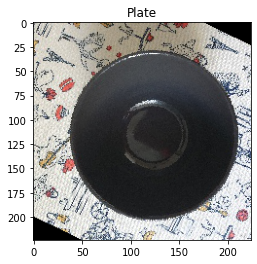

In [ ]:
path = train_folder + "/cleaned/0000.jpg"
img = Image.open(path)
img = rotate_and_resize(img)
img = np.array(img)
plt.title("Plate")
plt.imshow(img)
plt.show()

Определим набор перебираемых аугментаций-поворотов:

In [ ]:
rotators = [("Angle_20_flip", RandomRotateAndResize(20, flip = True, cutBlack = False)),
            ("Angle_40_flip", RandomRotateAndResize(40, flip = True, cutBlack = False))]

3. Определим набор аугментаций, вырезающих случайный кусок картинки из всей картинки

In [ ]:
resizers = [("Center_crop", T.CenterCrop(224)),
            ("Lower_bound_1.0", T.RandomCrop(224)),
            ("Lower_bound_0.8", T.RandomResizedCrop(224, (0.8, 1.0))),
            ("Lower_bound_0.6", T.RandomResizedCrop(224, (0.6, 1.0)))]

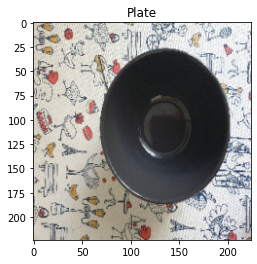

In [ ]:
from PIL import Image

path = train_folder + "/cleaned/0000.jpg"
img = Image.open(path)
img = resizers[2][1](img)
img = np.array(img)
plt.title("Plate")
plt.imshow(img)
plt.show()

4. Определим аугментацию - добавление шума на картинку:

In [ ]:
from math import log
from scipy import stats

class RandomNoise():
    def __init__(self, noise_levels, zones):
        # Это - диапозон, в котором, с заданной вероятностью, изменится цвет пикселя
        self.noise_levels = noise_levels
        # Это - зоны, в рамках которых разрешено менять цвет пикселя в диапозоне [-noise_levels[i]; noise_levels[i]] с заданной вероятностью
        self.zones = zones
        # Это - вероятность того, что дельта цвета пикселя будет лежать в диапозоне [-noise_levels[i]; noise_levels[i]]
        self.probability = 0.95
    
    def __call__(self, img):
        probability = 0.95
        
        image_h = img.shape[1]
        image_w = img.shape[2]
        sigma = log(1-self.probability)/self.noise_levels[0]
        noise_tensor = torch.from_numpy(stats.laplace.rvs(size = [3, image_h, image_w])/sigma)
        for noise, zone in zip(self.noise_levels, self.zones):
            sigma = log(1-self.probability)/noise
            laplace_noise_of_certain_level = torch.from_numpy(stats.laplace.rvs(size = [3, zone, zone])/sigma)
            noise_tensor[:, (image_h-zone)//2:(image_h-zone)//2+zone, (image_w-zone)//2:(image_w-zone)//2+zone] = laplace_noise_of_certain_level
        return img + noise_tensor

In [ ]:
random_noise = RandomNoise([0.4, 0.2, 0.2, 0.1], [224, 200, 150, 100])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 256, 342])
torch.Size([3, 256, 342])


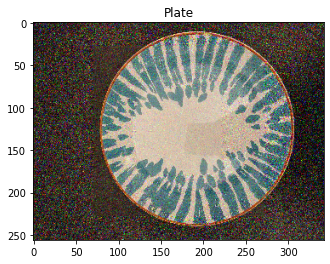

In [ ]:
path = train_folder + "/cleaned/0009.jpg"
img = Image.open(path)
img = transforms.ToTensor()(img)
print(img.shape)
img = random_noise(img)
print(img.shape)
plt.title("Plate")
plt.imshow(img.permute(1, 2, 0))
plt.show()

In [ ]:
noisers = [("Noiser", RandomNoise([0.4, 0.2, 0.1, 0.01], [224, 200, 150, 100]))]

5. Определим преобразование входных данных в pytorch tensor

In [ ]:
class ToFloat():
    def __init__(self):
        pass
    def __call__(self, tensor):
        return tensor.to(torch.float32)

to_float = [("ToFloat", ToFloat())]

6. Определим преобразование с тензор, на котором и будем обучать наши модели

In [ ]:
tensorifier = [("Tensorify", transforms.ToTensor())]
normalizer = [("Normalizer", transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]))]

In [ ]:
augmentations = [tensorifier, resizers, noisers, jitters, rotators, normalizer, to_float]

---

### Теперь создадим функцию, перебирающую всевозможные комбинации аугментаций
Так-как аугментации независимы, то не важно, в каком порядке их применять. Главное перебрать все наборы

1. Создадим функцию для подсчёта количества различных комбинаций объектов из множеств $ A_1, A_2, \cdots A_n, $ если из каждого множества нам необходимо взять по одному объекту. Все комбинации, естественно, должны быть различны. Иными словами, необходимо найти мощность множества Декартового произведения $ A_1 * A_2 * \cdots * A_n $

In [ ]:
def countCardinality(set_of_sets):
    cardinality = 1
    for _set in set_of_sets:
        cardinality *= len(_set)
    return cardinality

2. Создадим функцию для генерации всех элементов декартового произведения множеств $ A_1 * A_2 * \cdots * A_n $

In [ ]:
def generateCombinations(set_of_sets):
    combinations = list()
    for decimal_element_index in range(countCardinality(set_of_sets)):
        index = []
        for set_index in range(len(set_of_sets)):
            index.append(decimal_element_index%len(set_of_sets[set_index]))
            decimal_element_index = decimal_element_index//len(set_of_sets[set_index])
        combinations.append(np.array(index))
    return np.array(combinations)

3. Пользуясь функцией, описанной в пункте 2, сгенерируем словарь всевозможных комбинаций аугментаций из следующих множеств (массивов):  
jitters, rotators, scalers, resizers.

In [ ]:
def generateConfigurations(set_of_sets):
    sets_and_names = {}
    for mask in generateCombinations(set_of_sets):
        composite_element_name = ""
        element_list = []
        for j in range(len(set_of_sets)):
            element_name, element_object = set_of_sets[j][mask[j]]
            composite_element_name += element_name + "+"
            element_list.append(element_object)
        sets_and_names[composite_element_name] = element_list
    return sets_and_names

4. Создадим функцию, преобразовывающую набор аугментаций в аугментацию

In [ ]:
def convertToAugmentation(configurations):
    for key, value in configurations.items():
        configurations[key] = transforms.Compose(value)
    return configurations

In [ ]:
augmentations = convertToAugmentation(generateConfigurations(augmentations))

In [ ]:
list(augmentations.keys())[0]

'Tensorify+Center_crop+Noiser+Indentity_jitter+Angle_20_flip+Normalizer+ToFloat+'

---

### Задача: подготовить класс для кросс-валидации.  
Сделаем это следующим образом: все dataloader'ы будут принимать на вход всю папку с картинками, однако на вход каждому dataloader'у дополнительно передадим sampler, который будет из всех картинок выбирать лишь некоторое подмножество картинок. Сделаем это так, чтобы множество картинок для валидации и обучения не пересекались.

1. Переопределим класс ImageFolder: помимо картинки и таргета будем также возвращать путь до картинки. Такой класс может понадобится для дебага.

In [ ]:
class PlatesFolder(torchvision.datasets.ImageFolder):
    def __getitem__(self, idx):
        sample, target = super().__getitem__(idx)
        path, _ = self.samples[idx]
        return (path, sample, target)

2. Определим sampler, который будет выдавать случайный индекс из заранее определённого множества

In [ ]:
class RandomSubsetSampler(torch.utils.data.Sampler):
    def __init__(self, subset):
        self.subset = subset

    def __len__(self):
        return len(self.subset)
        
    def __iter__(self):
        return iter(np.random.permutation(self.subset))

3. Определим функцию, которая сгенерирует набор sampler'ов для кросс-валидации. На вход будет поступать количество fold'ов и размер исходной выборки.

In [ ]:
def getCrossValSamplers(folds, size, repeats = 4):
    samplerPairs = []
    for j in range(repeats):
        sample = np.random.permutation(np.arange(0, size, 1))
        for i in range(folds):
            valIdx = sample[i::folds]
            trainIdx = np.delete(sample, np.arange(i, size, folds))
            samplerPairs.append((RandomSubsetSampler(trainIdx), RandomSubsetSampler(valIdx)))
    return samplerPairs

---

### Задача: создать функцию для проверки гипотез  
Необходимо создать функцию, которая сможет оценить качество модели на входных данных. Так-как в будущем мы можем захотеть проверить несколько конфигураций сетей, разные оптимизаторы и scheduler'ы, то имеет смысл создать функцию, которая осуществит этот самый перебор по сетке.

Определим функцию, создающую Loader'ы по transform'ам:

In [ ]:
def getDataloader(transform, dataset, sampler, batch_size = 10):
    dataset = platesFolder(directory, transform)
    
    dataloader = torch.utils.data.DataLoader(
    dataset, batch_size = batch_size, drop_last = True, sampler = sampler, num_workers=1)
    
    return dataloader

Определим функцию для тестирования одной нейросети:

In [ ]:
def testNet(model, optimizer, scheduler, criterion, train_dataloader, val_dataloader, max_epoch, return_val = True):
    train_loss_ep, train_acc_ep, val_loss_ep, val_acc_ep = [], [], [], []
    for epoch in tqdm(range(max_epoch)):
        for mode in ["train", "valid"]:
            if mode == "train":
                model.train()
                dataloader = train_dataloader
                train_loss, train_acc, train_iter = 0., 0., 0.
            else:
                model.eval()
                dataloader = val_dataloader
                val_loss, val_acc, val_iter = 0., 0., 0.
                
            for path_batch, pic_batch, labels_batch in dataloader:
                pic_batch = pic_batch.to(device)
                labels_batch = labels_batch.to(device)
                optimizer.zero_grad()
                
                with torch.set_grad_enabled(mode == "train"):
                    outs = model(pic_batch)
                    loss = criterion(outs, labels_batch)
                    if mode == "train":
                        train_iter += 1
                        train_acc += (outs.argmax(dim = 1) == labels_batch).to(torch.float32).mean().item()
                        train_loss += loss.item()
                        loss.backward()
                        optimizer.step()
                    if mode == "valid":
                        val_iter += 1
                        val_acc += (outs.argmax(dim = 1) == labels_batch).to(torch.float32).mean().item()
                        val_loss += criterion.bceloss(outs, labels_batch)
                        if len(val_loss_ep) == 0 or val_loss < min(val_loss_ep):
                            best_model_pth = open("./best_model.pickle", "wb")
                            pickle.dump(model, best_model_pth)
        scheduler.step()
        
        train_acc_ep.append(train_acc/train_iter)
        train_loss_ep.append(train_loss/train_iter)
        val_acc_ep.append(val_acc/val_iter)
        val_loss_ep.append(val_loss/val_iter)
    
    if return_val:
        return (val_loss_ep[-1], val_acc_ep[-1])
    else:
        val_pred = getPredictions(model, path_batch, pic_batch, labels_batch)
        return {"Train_acc_hist": train_acc_ep, "Train_loss_hist": train_loss_ep, 
                "Val_acc_hist": val_acc_ep, "Val_loss_hist": val_loss_ep, "Val_loss_by_obj": val_pred}

In [ ]:
def getPredictions(model, path_batch, pic_batch, label_batch):
    prob_batch = model(pic_batch)
    prob_batch = torch.nn.functional.softmax(prob_batch, dim = 1)[:, 1].data.cpu().numpy()
    return (path_batch, label_batch, prob_batch)

Определим класс, производящий отбор лучших элементов:

In [ ]:
class topItems():
    def __init__(self, size_of_buffer, cmp):
        self.size_of_buffer = size_of_buffer
        self.cmp = cmp
        self.buffer = []
    
    def add(self, new_item):
        if len(self.buffer) == 0:
            self.buffer.append(new_item)

        elif len(self.buffer) == 1:
            res = self.cmp(self.buffer[0], new_item)
            if res == -1:
                self._insert_item(new_item, 1)
            if res >= 0:
                self._insert_item(new_item, 0)

        else:
            lbound = 0
            hbound = len(self.buffer) - 1
            # Проверка на то, меньше ли он, чем buffer[lbound]
            if self.cmp(new_item, self.buffer[lbound]) == -1:
                if len(self.buffer) < self.size_of_buffer:
                    self._insert_item(new_item, 0)
                    return 1
                else:
                    return -1
            # Проверка на то, больше ли он чем buffer[hbound]
            elif self.cmp(new_item, self.buffer[hbound]) == 1:
                self._insert_item(new_item, len(self.buffer))
                return 1
            # Гарантируем поддержание инварианта: элемент всегда больше, чем buffer[lbound] и меньше, чем buffer[hbound]
            else:
                while hbound - lbound > 1:
                    res = self.cmp(new_item, self.buffer[(hbound + lbound)//2])
                    if res == 1:
                        lbound = (hbound + lbound)//2
                    if res == -1:
                        hbound = (hbound + lbound)//2
                    if res == 0:
                        lbound = (hbound + lbound)//2
                        hbound = lbound + 1
                self._insert_item(new_item, lbound + 1)
                return 1
        
    def _insert_item(self, item, index):
        self.buffer.append(-1)
        for i in range(len(self.buffer) - 1, index, -1):
            self.buffer[i] = self.buffer[i - 1]
        self.buffer[index] = item
        if len(self.buffer) > self.size_of_buffer:
            del self.buffer[0]

Определим функцию, производящую сравнение двух аугментаторов по качеству:

In [ ]:
from math import copysign

def compareStrats(stats1, stats2):
    # Тот, у кого ниже loss - тот и лучше
    if abs(stats1[1][0] - stats2[1][0]) > 0.001:
        return copysign(-1, stats2[1][1] - stats1[1][1])
    # Тот, у кого выше acc - тот и лучше
    elif abs(stats1[1][1] - stats2[1][1]) > 0.001:
        return copysign(1, stats1[1][0] - stats2[1][0])
    else:
        return 0

Определим функцию, перебирающую всевозможные объекты:

In [ ]:
def qualityEstimator(model, train_transforms, val_transform, restarter, cv = 4, repeats = 4, max_epoch = 30, batch_size = 4):
    
    criterion = torch.nn.CrossEntropyLoss()
    best_transformers = topItems(240, compareStrats)
    val_dataset = PlatesFolder(train_folder, val_transform)
    
    for name, train_transform in tqdm(train_transforms.items()):
        train_dataset = PlatesFolder(train_folder, train_transform)
        acc = 0
        loss = 0
        for train_sampler, val_sampler in getCrossValSamplers(cv, len(train_dataset), repeats = repeats):
            restarter(model)
            val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size = batch_size, 
                                                         drop_last = True, sampler = val_sampler, num_workers=1)
            train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size = batch_size, 
                                                          drop_last = True, sampler = train_sampler, num_workers=1, shuffle = True)
            
            optimizer = torch.optim.Adam(model.parameters(), lr=1.0e-4)
            scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=50, gamma=0.1)
            
            loss_sample, acc_sample = testNet(model, optimizer, scheduler, criterion, train_dataloader, val_dataloader, max_epoch)
            acc += acc_sample
            loss += loss_sample
        best_transformers.add([name, (loss/(repeats*cv), acc/(repeats*cv))])
    
    return best_transformers

Определим функцию, обновляющую параметры модели (Необходимо для перебора моделей во время обучения):

In [ ]:
def resnetRestarter_(resnet):
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    resnet.fc = torch.nn.Linear(model.fc.in_features, 2).to(device)
    
    return resnet

### Задача: создать функцию для проверки архитектур.

1. Определим функцию, которая для каждой пары "трансформация + нейросеть" создаст свою матрицу объектов-признаков. Это нужно за тем, чтобы не вызывать для каждой новой модели заново feature extractor и для удобства использования sklearn. Также это необходимо для сокращения числа forward'ов нейросети, что ускорит процесс экспериментов.

In [ ]:
val_transform = transforms.Compose([
    transforms.CenterCrop((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

2. Определим следующие функции:  
  2.1 Функцию, создающую несколько видов перцептронов  
  2.2 Функцию, создающую несколько видов случайных лесов

In [ ]:
def getFCfeatures(net):
    if str(type(net)) == "<class 'torchvision.models.densenet.DenseNet'>":
        return net.classifier.in_features
    if str(type(net)) == "<class 'torchvision.models.resnet.ResNet'>":
        return net.fc.in_features
    if str(type(net)) == "<class 'torchvision.models.vgg.VGG'>":
        return net.classifier[0].in_features
    if str(type(net)) == "<class 'torchvision.models.googlenet.GoogLeNet'>":
        return net.fc.in_features
    if str(type(net)) == "<class 'int'>":
        # В этом случае нам передали не нейросеть, а число параметров
        return net

In [ ]:
import copy

def getPerceptron(model, layersQty: int = 2, deepNeuronsQty: list = None, 
                  activation = torch.nn.ReLU(), dropout_prob: int = 0.0):
    structure = []
    if deepNeuronsQty is None:
        deepNeuronsQty = np.linspace(getFCfeatures(model), 2, layersQty).astype(int)
    else:
        deepNeuronsQty.insert(0, getFCfeatures(model))
        deepNeuronsQty.append(2)
    neuronsQty = copy.deepcopy(deepNeuronsQty)
    for layerNum in range(layersQty - 2):
        structure.append(torch.nn.Linear(neuronsQty[layerNum], neuronsQty[layerNum + 1]))
        structure.append(torch.nn.Dropout(p = dropout_prob))
        if dropout_prob == 0:
            structure.append(torch.nn.BatchNorm1d(neuronsQty[layerNum + 1]))
        structure.append(activation)
    structure.append(torch.nn.Linear(neuronsQty[layersQty-2], neuronsQty[layersQty-1]))
    return torch.nn.Sequential(*structure).to(device)

3. Определим класс - BCE+L1_loss:

In [ ]:
class CEL_and_l1():
    def __init__(self, l1_reg = 0.0, model_parameters = None):
        self.l1_reg = l1_reg
        self.model_parameters = model_parameters
        self.cel = torch.nn.CrossEntropyLoss()

    def __call__(self, preds, labels):
        return self.cel(preds, labels) + self.l1_reg*self.l1_regulizer()

    def bceloss(self, preds, labels):
        return self.cel(preds, labels)

    def l1_regulizer(self):
        loss_addition = 0
        for weight in self.model_parameters:
            if weight.requires_grad == True:
                loss_addition += weight.abs().sum()
        return loss_addition

### Готовим ансамбль.

In [ ]:
train_samplers, val_samplers = getCrossValSamplers(folds = 4, size = 40, repeats = 1)

1. Обучим ResNet 50 для ансамбля:

In [ ]:
backbone = torchvision.models.resnet50(pretrained = True)

In [ ]:
layer4_last = torch.nn.Sequential(
    torch.nn.Conv2d(in_channels = backbone.layer4[-1].conv1.in_channels, 
                    out_channels = backbone.layer4[-1].conv1.in_channels//4, kernel_size = 3),
    torch.nn.BatchNorm2d(backbone.layer4[-1].conv1.in_channels//4),
    torch.nn.Conv2d(in_channels = backbone.layer4[-1].conv1.in_channels//4, 
                    out_channels = backbone.layer4[-1].conv1.in_channels//8, kernel_size = 3),
    torch.nn.BatchNorm2d(backbone.layer4[-1].conv1.in_channels//8)
)

In [ ]:
model = backbone.to(device)
backbone_out = backbone.layer4[-1].conv1.in_channels//8

for param in model.parameters():
    param.requires_grad = False
model.layer4[-1] = layer4_last.to(device)

perceptron = getPerceptron(backbone_out, layersQty = 2, dropout_prob = 0.).to(device)
model.fc = perceptron

optimizer = torch.optim.AdamW(model.parameters(), lr = 1e-02, weight_decay=0.)
criterion = CEL_and_l1(l1_reg = 0.1, model_parameters = model.parameters())
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20)
augmentation = augmentations['Tensorify+Center_crop+Noiser+Chaos+Angle_40_flip+Normalizer+ToFloat+']

max_epoch = 240
batch_size = 10
train_dataset, val_dataset = PlatesFolder("./train", transform = augmentation), PlatesFolder("./val", transform = val_transform)
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size = batch_size, 
                                              drop_last = True, shuffle = True, num_workers=1)
val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size = batch_size, 
                                            drop_last = True, num_workers=1)
next(iter(val_dataloader))

train_acc, train_loss, val_acc, val_loss, val_loss_by_obj = testNet(model, optimizer, scheduler, criterion, 
        train_dataloader, val_dataloader, max_epoch, return_val = False).values()

100%|██████████| 240/240 [08:13<00:00,  2.06s/it]


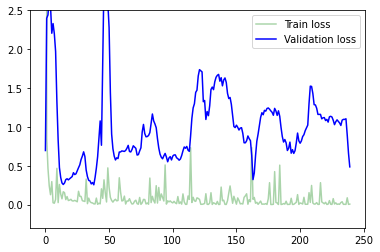

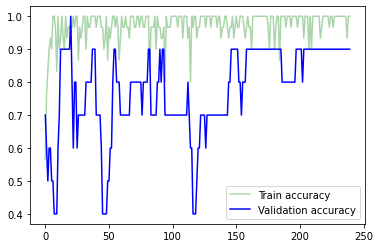

In [ ]:
plt.ylim([-0.3, 2.5])
plt.plot(np.arange(max_epoch), train_loss, label = "Train loss", color = "green", alpha = 0.333)
plt.plot(np.arange(max_epoch), val_loss, label = "Validation loss", color = "blue")
plt.legend()
plt.show()
plt.plot(np.arange(max_epoch), train_acc, label = "Train accuracy", color = "green", alpha = 0.333)
plt.plot(np.arange(max_epoch), val_acc, label = "Validation accuracy", color = "blue")
plt.legend()
plt.show()

./val/cleaned/0006.jpg


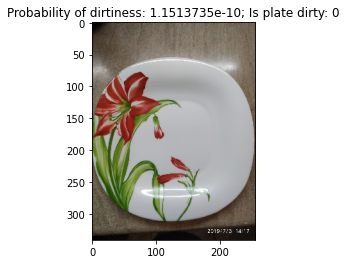

./val/cleaned/0013.jpg


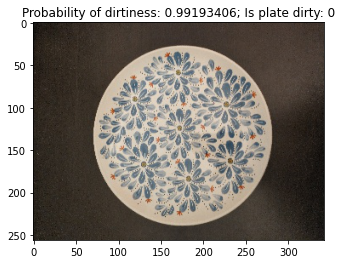

./val/cleaned/0014.jpg


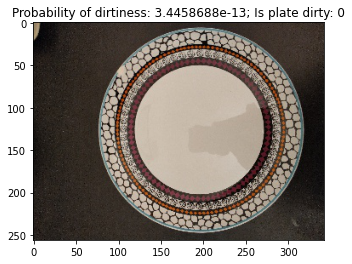

./val/cleaned/0015.jpg


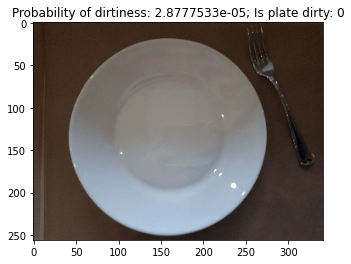

./val/cleaned/0018.jpg


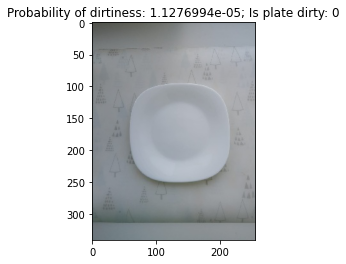

./val/dirty/0006.jpg


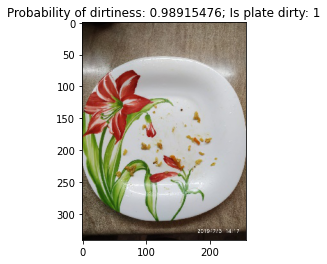

./val/dirty/0013.jpg


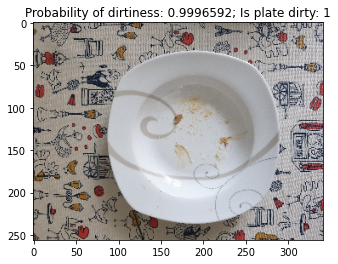

./val/dirty/0014.jpg


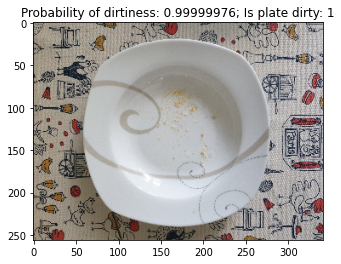

./val/dirty/0015.jpg


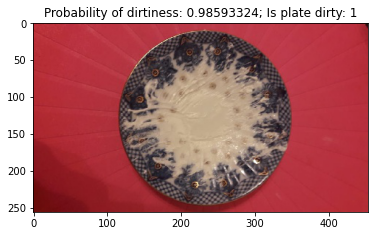

./val/dirty/0018.jpg


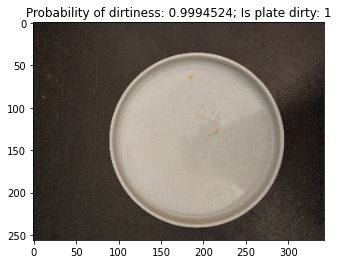

In [ ]:
for path, label, prob in zip(val_loss_by_obj[0], val_loss_by_obj[1], val_loss_by_obj[2]):
    print(path)
    img = np.array(Image.open(path))
    plt.title("Probability of dirtiness: " + str(prob) + "; " + "Is plate dirty: " + str(label.item()))
    plt.imshow(img)
    plt.show()

In [ ]:
file_pth = open("./best_model.pickle", "rb")
resnet50 = pickle.load(file_pth)

2. Обучим densenet 121 для ансамбля

In [ ]:
model = torchvision.models.densenet121(pretrained = True).to(device)

for param in model.parameters():
    param.requires_grad = False
for param in model.features.denseblock4.denselayer16.parameters():
    param.requires_grad = True
for param in model.features.norm5.parameters():
    param.requires_grad = True

perceptron = getPerceptron(model, layersQty = 2, dropout_prob = 0.).to(device)
model.classifier = perceptron

optimizer = torch.optim.AdamW(model.parameters(), lr = 1e-02, weight_decay=0.)
criterion = CEL_and_l1(l1_reg = 0.1, model_parameters = model.parameters())
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20)
augmentation = augmentations['Tensorify+Lower_bound_0.6+Noiser+Chaos+Angle_40_flip+Normalizer+ToFloat+']

max_epoch = 240
batch_size = 10
train_dataset, val_dataset = PlatesFolder("./train", transform = augmentation), PlatesFolder("./val", transform = val_transform)
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size = batch_size, 
                                              drop_last = True, shuffle = True, num_workers=1)
val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size = batch_size, 
                                            drop_last = True, num_workers=1)
next(iter(val_dataloader))

train_acc, train_loss, val_acc, val_loss, val_loss_by_obj = testNet(model, optimizer, scheduler, criterion, 
        train_dataloader, val_dataloader, max_epoch, return_val = False).values()

100%|██████████| 240/240 [08:34<00:00,  2.14s/it]


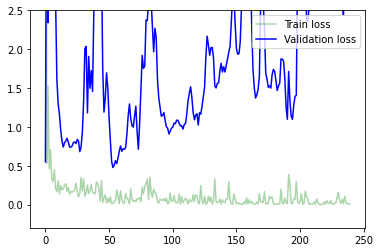

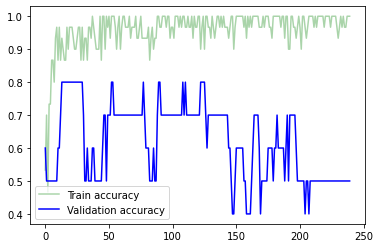

In [ ]:
plt.ylim([-0.3, 2.5])
plt.plot(np.arange(max_epoch), train_loss, label = "Train loss", color = "green", alpha = 0.333)
plt.plot(np.arange(max_epoch), val_loss, label = "Validation loss", color = "blue")
plt.legend()
plt.show()
plt.plot(np.arange(max_epoch), train_acc, label = "Train accuracy", color = "green", alpha = 0.333)
plt.plot(np.arange(max_epoch), val_acc, label = "Validation accuracy", color = "blue")
plt.legend()
plt.show()

./val/cleaned/0006.jpg


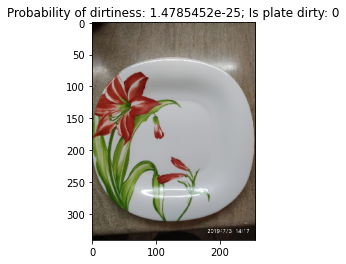

./val/cleaned/0013.jpg


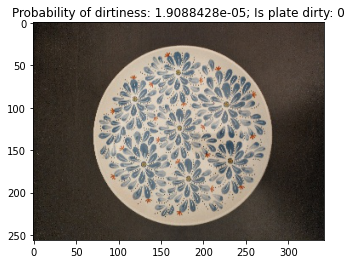

./val/cleaned/0014.jpg


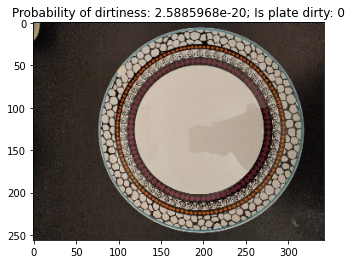

./val/cleaned/0015.jpg


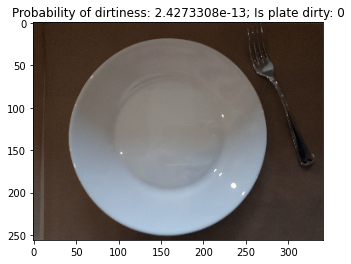

./val/cleaned/0018.jpg


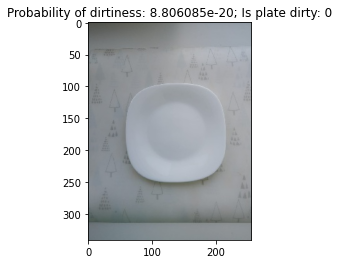

./val/dirty/0006.jpg


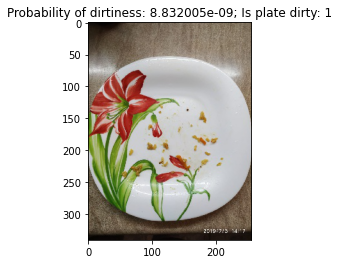

./val/dirty/0013.jpg


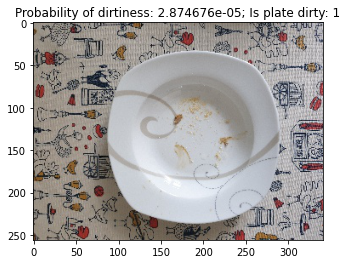

./val/dirty/0014.jpg


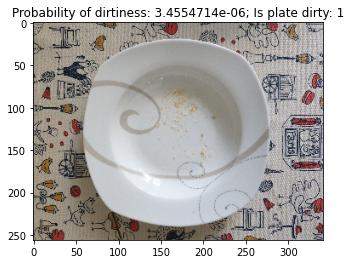

./val/dirty/0015.jpg


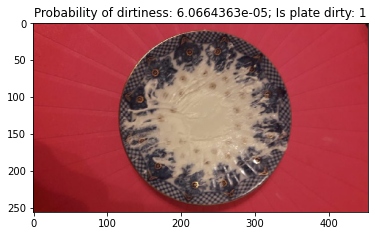

./val/dirty/0018.jpg


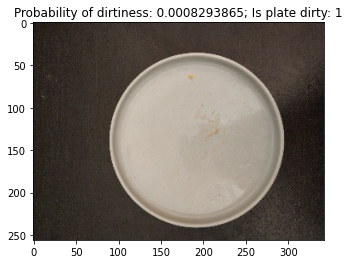

In [ ]:
for path, label, prob in zip(val_loss_by_obj[0], val_loss_by_obj[1], val_loss_by_obj[2]):
    print(path)
    img = np.array(Image.open(path))
    plt.title("Probability of dirtiness: " + str(prob) + "; " + "Is plate dirty: " + str(label.item()))
    plt.imshow(img)
    plt.show()

In [ ]:
file_pth = open("./best_model.pickle", "rb")
densenet121 = pickle.load(file_pth)

3. Обучим ResNeXt50 для ансамбля:

In [ ]:
backbone = torchvision.models.resnext50_32x4d(pretrained = True).to(device)

In [ ]:
layer4_last = torch.nn.Sequential(
    torch.nn.Conv2d(in_channels = backbone.layer4[-1].conv1.in_channels, 
                    out_channels = backbone.layer4[-1].conv1.in_channels//4, groups = 32, kernel_size = 3),
    torch.nn.BatchNorm2d(backbone.layer4[-1].conv1.in_channels//4),
    torch.nn.Conv2d(in_channels = backbone.layer4[-1].conv1.in_channels//4, 
                    out_channels = backbone.layer4[-1].conv1.in_channels//8, groups = 32, kernel_size = 3),
    torch.nn.BatchNorm2d(backbone.layer4[-1].conv1.in_channels//8)
)

In [ ]:
model = backbone
backbone_out = model.layer4[-1].conv1.in_channels//8

for param in model.parameters():
    param.requires_grad = False
model.layer4[-1] = layer4_last.to(device)

perceptron = getPerceptron(backbone_out, layersQty = 2, dropout_prob = 0.).to(device)
model.fc = perceptron

optimizer = torch.optim.AdamW(model.parameters(), lr = 1e-02, weight_decay=0.)
criterion = CEL_and_l1(l1_reg = 0.1, model_parameters = model.parameters())
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20)
augmentation = augmentations['Tensorify+Lower_bound_0.6+Noiser+Chaos+Angle_40_flip+Normalizer+ToFloat+']

max_epoch = 240
batch_size = 10
train_dataset, val_dataset = PlatesFolder("./train", transform = augmentation), PlatesFolder("./val", transform = val_transform)
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size = batch_size, 
                                              drop_last = True, shuffle = True, num_workers=1)
val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size = batch_size, 
                                            drop_last = True, num_workers=1)
next(iter(val_dataloader))

train_acc, train_loss, val_acc, val_loss, val_loss_by_obj = testNet(model, optimizer, scheduler, criterion, 
        train_dataloader, val_dataloader, max_epoch, return_val = False).values()

100%|██████████| 240/240 [08:39<00:00,  2.16s/it]


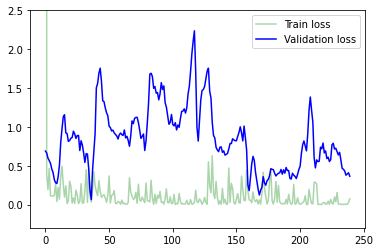

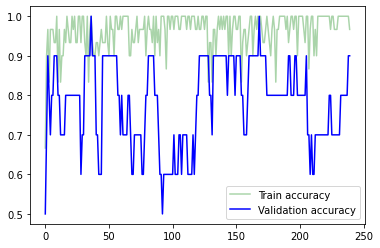

In [ ]:
plt.ylim([-0.3, 2.5])
plt.plot(np.arange(max_epoch), train_loss, label = "Train loss", color = "green", alpha = 0.333)
plt.plot(np.arange(max_epoch), val_loss, label = "Validation loss", color = "blue")
plt.legend()
plt.show()
plt.plot(np.arange(max_epoch), train_acc, label = "Train accuracy", color = "green", alpha = 0.333)
plt.plot(np.arange(max_epoch), val_acc, label = "Validation accuracy", color = "blue")
plt.legend()
plt.show()

./val/cleaned/0006.jpg


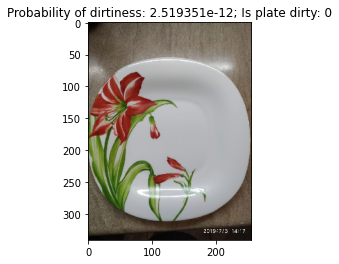

./val/cleaned/0013.jpg


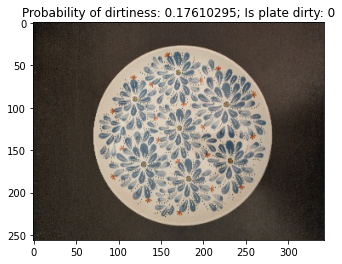

./val/cleaned/0014.jpg


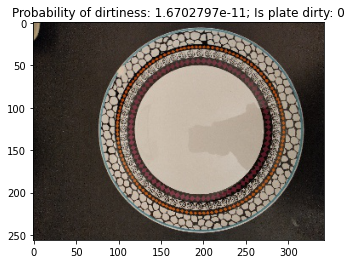

./val/cleaned/0015.jpg


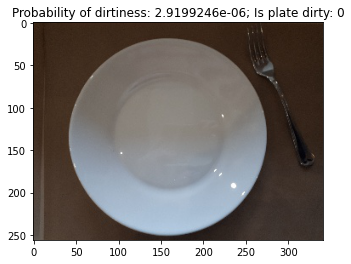

./val/cleaned/0018.jpg


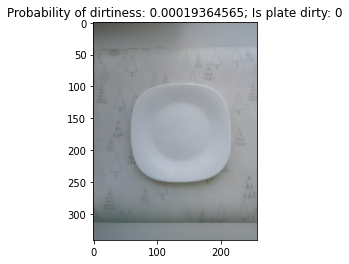

./val/dirty/0006.jpg


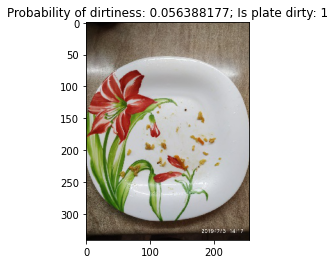

./val/dirty/0013.jpg


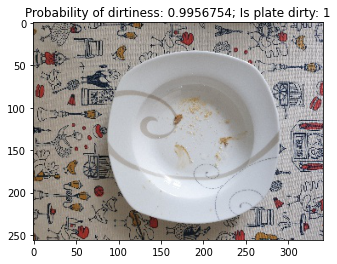

./val/dirty/0014.jpg


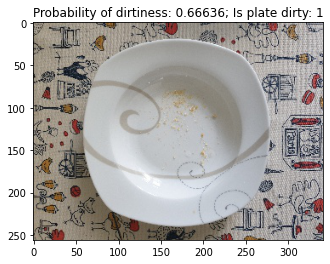

./val/dirty/0015.jpg


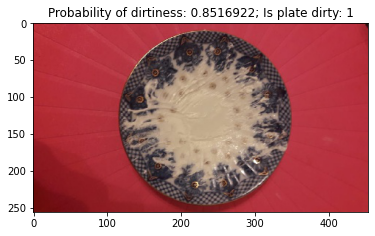

./val/dirty/0018.jpg


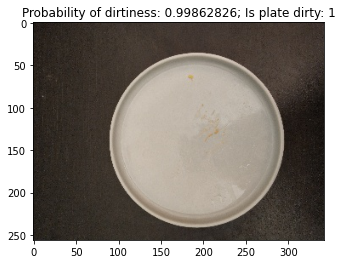

In [ ]:
for path, label, prob in zip(val_loss_by_obj[0], val_loss_by_obj[1], val_loss_by_obj[2]):
    print(path)
    img = np.array(Image.open(path))
    plt.title("Probability of dirtiness: " + str(prob) + "; " + "Is plate dirty: " + str(label.item()))
    plt.imshow(img)
    plt.show()

In [ ]:
file_pth = open("./best_model.pickle", "rb")
resnext50 = pickle.load(file_pth)

In [ ]:
class VotingNNs():
    def __init__(self, models):
        self.models = models
    
    def __call__(self, x):
        ans = 0
        for model in self.models:
            ans += model(x)
        return (ans/len(self.models))
    
    def eval(self):
        for model in self.models:
            model.eval()

In [ ]:
model = VotingNNs([resnet50, densenet121, resnext50])

In [ ]:
model.eval()

class ImageFolderWithPaths(torchvision.datasets.ImageFolder):
    def __getitem__(self, index):
        original_tuple = super(ImageFolderWithPaths, self).__getitem__(index)
        path = self.imgs[index][0]
        tuple_with_path = (original_tuple + (path,))
        return tuple_with_path

batch_size = 16*7
test_dataset = ImageFolderWithPaths(train_dir, val_transform)
val_dataset = torchvision.datasets.ImageFolder(val_dir, val_transform) #

test_dataloader = torch.utils.data.DataLoader(
    val_dataset, batch_size=batch_size, shuffle=False, num_workers=0) #

test_predictions = []
test_img_paths = []
for inputs, labels in tqdm(test_dataloader): #
    inputs = inputs.to(device)
    labels = labels.to(device)
    with torch.set_grad_enabled(False):
        preds = model(inputs)
    test_predictions.append(
        torch.nn.functional.softmax(preds, dim=1)[:,1].data.cpu().numpy())
    
test_predictions = np.concatenate(test_predictions)

100%|██████████| 1/1 [00:00<00:00,  8.03it/s]


tensor(0)


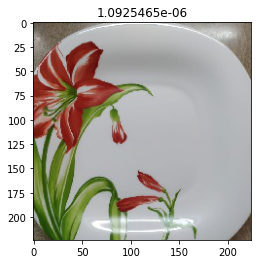

tensor(0)


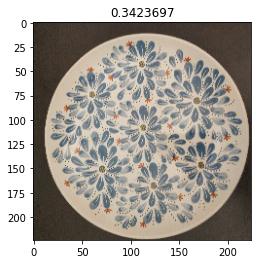

tensor(0)


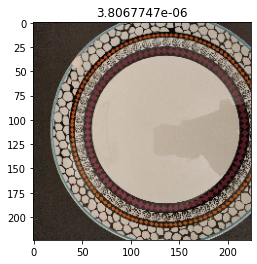

tensor(0)


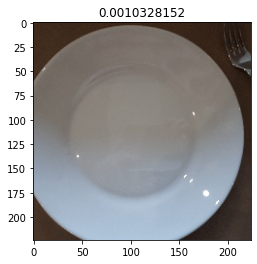

tensor(0)


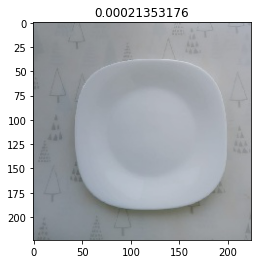

tensor(1)


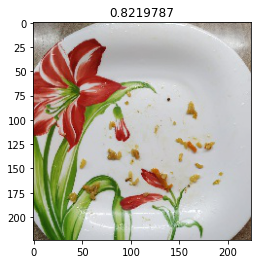

tensor(1)


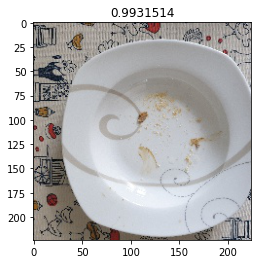

tensor(1)


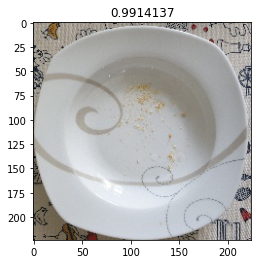

tensor(1)


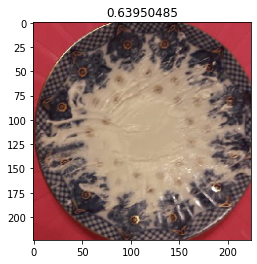

tensor(1)


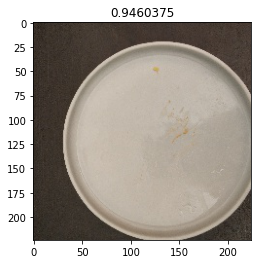

In [ ]:
inputs, labels = next(iter(test_dataloader)) #

mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

def show_input(input_tensor, title=''):
    image = input_tensor.permute(1, 2, 0).numpy()
    image = std * image + mean
    plt.imshow(image.clip(0, 1))
    plt.title(title)
    plt.show()
    plt.pause(0.001)

for img, pred, label in zip(inputs, test_predictions, labels):
    print(label)
    show_input(img, title=pred)

In [ ]:
class ImageFolderWithPaths(torchvision.datasets.ImageFolder):
    def __getitem__(self, index):
        original_tuple = super(ImageFolderWithPaths, self).__getitem__(index)
        path = self.imgs[index][0]
        tuple_with_path = (original_tuple + (path,))
        return tuple_with_path
    
test_dataset = ImageFolderWithPaths('./dataset/plates', val_transform)

test_dataloader = torch.utils.data.DataLoader(
    test_dataset, batch_size=batch_size, shuffle=False, num_workers=0)

In [ ]:
model.eval()

test_predictions = []
test_img_paths = []
for inputs, labels, paths in tqdm(test_dataloader):
    inputs = inputs.to(device)
    labels = labels.to(device)
    with torch.set_grad_enabled(False):
        preds = model(inputs)
    test_predictions.append(
        torch.nn.functional.softmax(preds, dim=1)[:,1].data.cpu().numpy())
    test_img_paths.extend(paths)
    
test_predictions = np.concatenate(test_predictions)

100%|██████████| 7/7 [00:07<00:00,  1.06s/it]


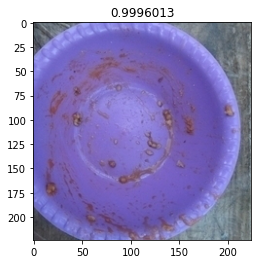

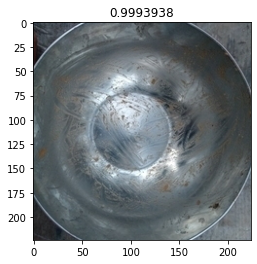

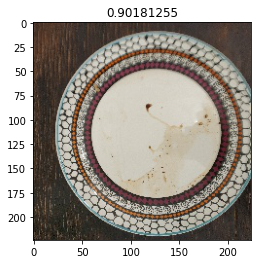

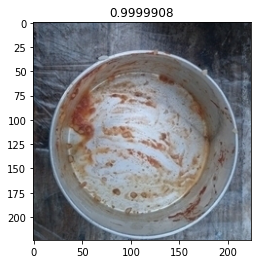

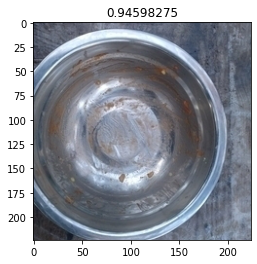

...

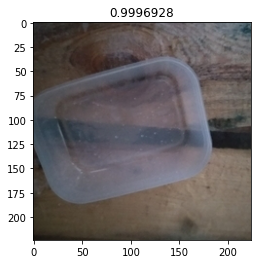

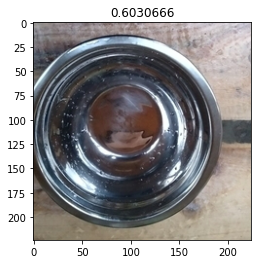

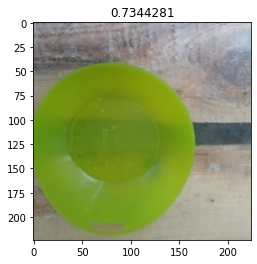

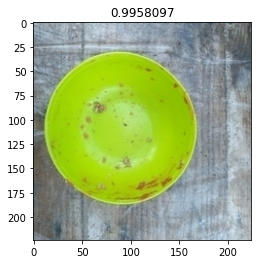

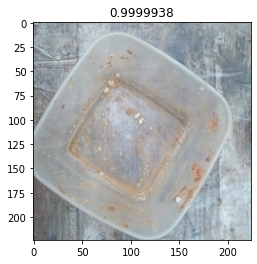

In [ ]:
inputs, labels, paths = next(iter(test_dataloader))

for img, pred in zip(inputs, test_predictions):
    show_input(img, title=pred)

In [ ]:
submission_df = pd.DataFrame.from_dict({'id': test_img_paths, 'label': test_predictions})

In [ ]:
submission_df['label'] = submission_df['label'].map(lambda pred: 'dirty' if pred > 0.85 else 'cleaned')
submission_df['id'] = submission_df['id'].str.replace('./dataset/plates/test/', '')
submission_df['id'] = submission_df['id'].str.replace('.jpg', '')
submission_df = submission_df[:-40]
submission_df.set_index('id', inplace=True)
submission_df.head(n=6)

,label
id,
0000,dirty
0001,dirty
0002,dirty
0003,dirty
0004,dirty
0005,dirty


In [ ]:
submission_df[:-40].tail(4)

,label
id,
0700,cleaned
0701,dirty
0702,dirty
0703,dirty


In [ ]:
submission_df.to_csv('submission.csv')

In [ ]:
!ls ./

best_model.pickle  dataset  drive  sample_data	submission.csv	train  val


In [ ]:
!ls test

ls: cannot access 'test': No such file or directory


In [ ]:
errorlol

NameError: ignored

In [ ]:
!rm -rf train val test

### """FIN"""

Test block

In [ ]:
import torchvision

denseNet = torchvision.models.densenet201(pretrained = True)
resNet = torchvision.models.resnet18(pretrained = True)
resNeXt = torchvision.models.resnext50_32x4d(pretrained = True)
mdls = {"denseNet": denseNet, "resNet": resNet, "resNeXt": resNeXt}

In [ ]:
print("DenseNet has {} in features".format(denseNet.classifier.in_features))
print("ResNet has {} in features".format(resNet.fc.in_features))
print("ResNeXt has {} in features".format(resNeXt.fc.in_features))

In [ ]:
for name, param in denseNet.features.denseblock4.named_parameters():
    if int(name.split(".")[0].replace("denselayer", "")) >= 30:
        print(name)

In [ ]:

resNet = torchvision.models.resnet18(pretrained = True)
for name, param in resNet.named_parameters():
    print(name)

In [ ]:
for name, param in resNeXt.layer4[2].named_parameters():
    print(name)

In [ ]:
from torch import nn

m = nn.Dropout(p=0.1)
input = torch.randn(20, 16)
output = m(input)
output

In [ ]:
import numpy as np

